In [1]:
suppressMessages({
library(Seurat)
library(tidyverse)
library(ggpubr)
dotenv::load_dot_env()
Sys.setenv("PATH" = paste0(Sys.getenv("PATH"), ":", Sys.getenv("FAST_TSNE_BIN")))
})

In [2]:
CD14 = readRDS(Sys.getenv("CD14srobj"))
CDmeta = read.table(Sys.getenv("CD14metafile"), sep="\t", header=1)
rownames(CDmeta) = CDmeta$CellID

In [3]:
CD14@meta.data = cbind(CD14@meta.data, CDmeta[colnames(CD14),])

In [4]:
CD14

An object of class Seurat 
44884 features across 139342 samples within 2 assays 
Active assay: SCT (21865 features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

# Tsnes celltypes

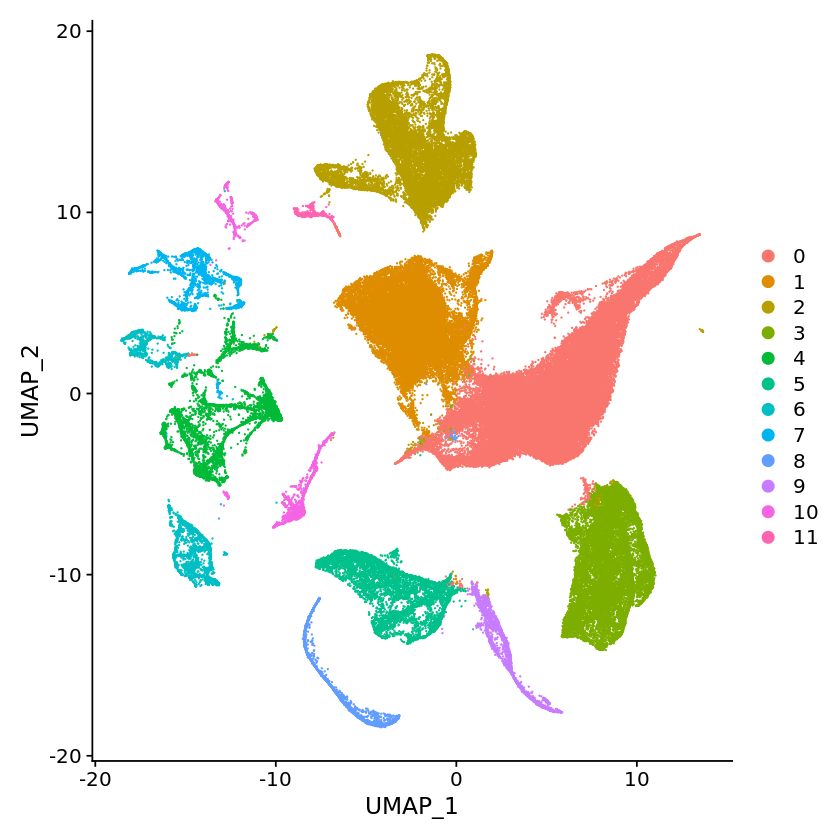

In [5]:
DimPlot(CD14, reduction="umap")

In [2]:
FIGDIR=file.path(Sys.getenv("FIGDIR"), "cd14atlas", "tsne")
dir.create(FIGDIR, recursive = TRUE, showWarnings = FALSE)

In [3]:
celltype_colors = c(CD.Epith = '#3BA63B', CD.Fibroblast = '#D62728', CD.Epith_Paneth = '#99C699',
                CD.Endth = '#FF9B45', CD.Mloid = '#8C564B', CD.Mstcl = '#E586C8',
                CD.Tclls = '#1ABECF', CD.Bclls = '#1F77B4', CD.IGA_IGL_Plsma= '#7F7F7F',
                CD.IGA_Plsma = '#7F7F7F', CD.IGG_Plsma = '#3F3F3F', CD.IGM_Plsma= '#BFBFBF')

In [8]:
srobj =  CD14[, !grepl("Doub|LowQual", CD14$type)]

In [9]:
srobj

An object of class Seurat 
44884 features across 124054 samples within 2 assays 
Active assay: SCT (21865 features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


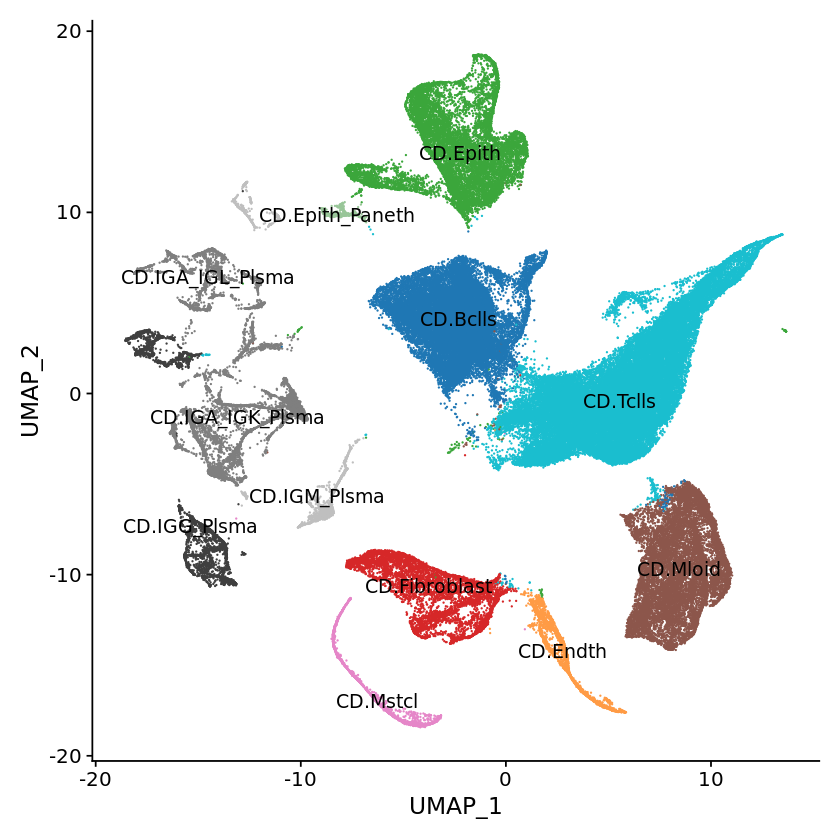

In [10]:
p = DimPlot(srobj, reduction="umap", group.by="tier1name", label=TRUE, cols=celltype_colors)
p + NoLegend()

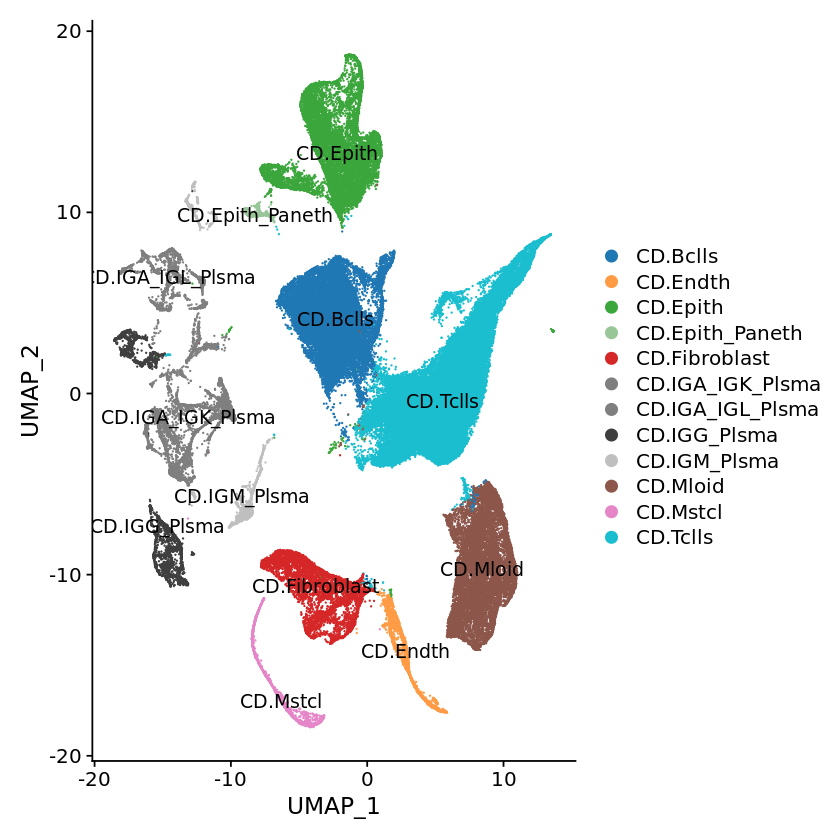

In [11]:
p

In [16]:
srobj <- RunTSNE(srobj, 
                 initialization = srobj@reductions$pca@cell.embeddings[, 1:2],
                 perplexity_list = c(30, ncol(srobj)/100),
                 learning_rate = ncol(srobj)/12,
                 exaggeration = 12,
                 dims = 1:22,
                 tsne.method = "FIt-SNE",
                 fast_tsne_path = file.path(Sys.getenv("FAST_TSNE_BIN"), "fast_tsne"),
                 verbose=TRUE
                 )

Warning message:
“The following arguments are not used: pca”


In [18]:
srobj

An object of class Seurat 
44884 features across 124054 samples within 2 assays 
Active assay: SCT (21865 features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

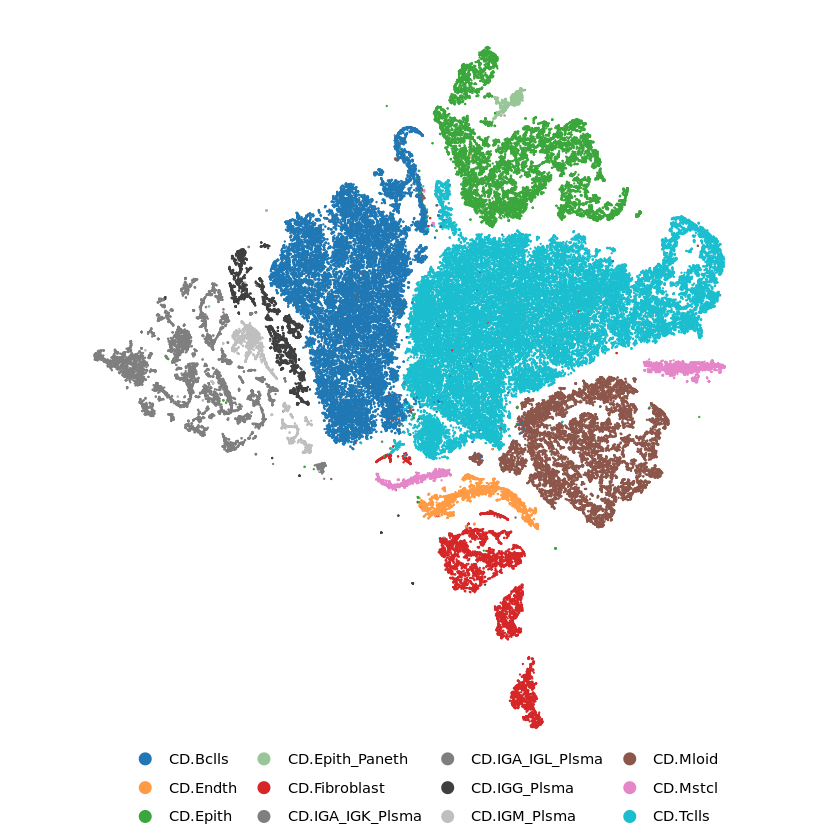

In [32]:
p = DimPlot(srobj, group.by="tier1name", cols=celltype_colors) +
    theme_void() +
    coord_fixed(xlim = c(-150, 120), ylim = c(-150, 120)) +
    theme(legend.position="bottom")
p

In [33]:
L = get_legend(p)
# p + NoLegend()
# as_ggplot(L)
ggsave(plot = p + NoLegend(), 
       file=file.path(FIGDIR, "20200525allCD_celltypes_tsne_points.pdf"),
       height=10,
       width=10,
       useDingbats=FALSE)
ggsave(plot = as_ggplot(L),
       file=file.path(FIGDIR, "20200525allCD_celltypes_tsne_legend.pdf"),
       useDingbats=FALSE)

Saving 6.67 x 6.67 in image



# Tsnes patient

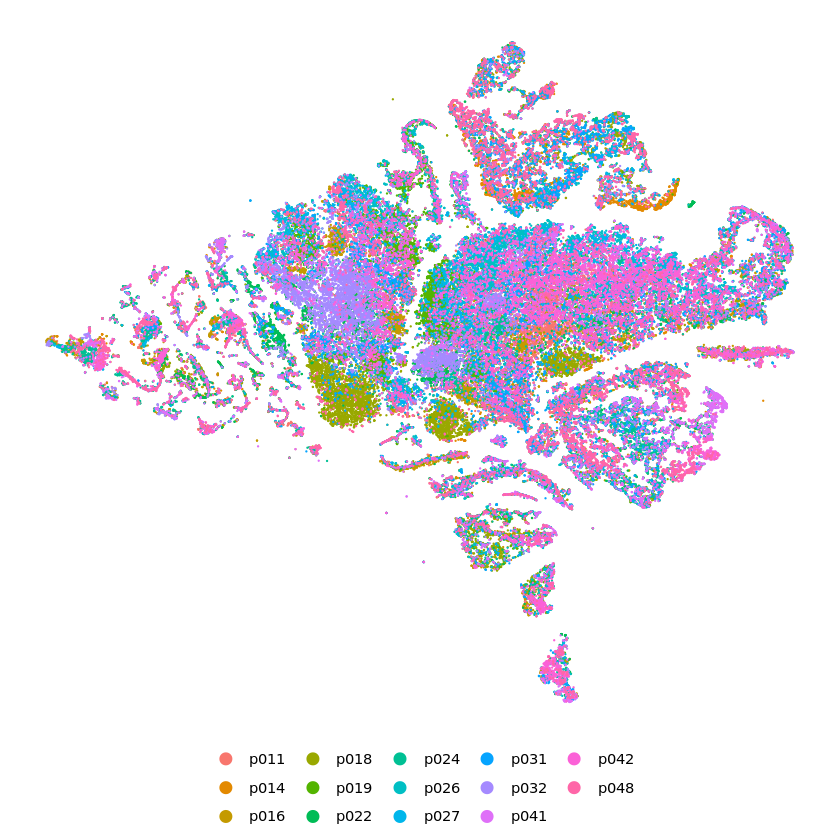

In [34]:
p = DimPlot(srobj, group.by="patient") +
    theme_void() +
    theme(legend.position="bottom")
p

In [35]:
L = get_legend(p)
# p + NoLegend()
# as_ggplot(L)
ggsave(plot = p + NoLegend(), 
       file=file.path(FIGDIR, "20200525allCD_patient_tsne_points.pdf"),
       height=10,
       width=10,
       useDingbats=FALSE)
ggsave(plot = as_ggplot(L),
       file=file.path(FIGDIR, "20200525allCD_patient_tsne_legend.pdf"),
       useDingbats=FALSE)

Saving 6.67 x 6.67 in image



In [36]:
levels(srobj$patient)

[1] "p011" "p014" "p016" "p018" "p019" "p022" "p024" "p026" "p027" "p031"
[11] "p032" "p041" "p042" "p048"

In [37]:
plist = lapply(levels(srobj$patient), function(id){
    p = DimPlot(srobj[, srobj$patient == id],
                group.by="tier1name", 
                cols=celltype_colors) +
    theme_void() +
    coord_fixed(xlim = c(-150,120), ylim = c(-150,120)) +
#     theme(legend.position="bottom", 
#           axis.ticks.x = element_blank(),
#           axis.ticks.y = element_blank(),
#           axis.text.x = element_blank(),
#           axis.text.y = element_blank(),
#           ) + 
#     labs(x = "", y = "") +
    ggtitle(id) +
    NoLegend()
    return(p)
})


# ppoints = lapply(plist, function(p) {p + NoLegend() + })

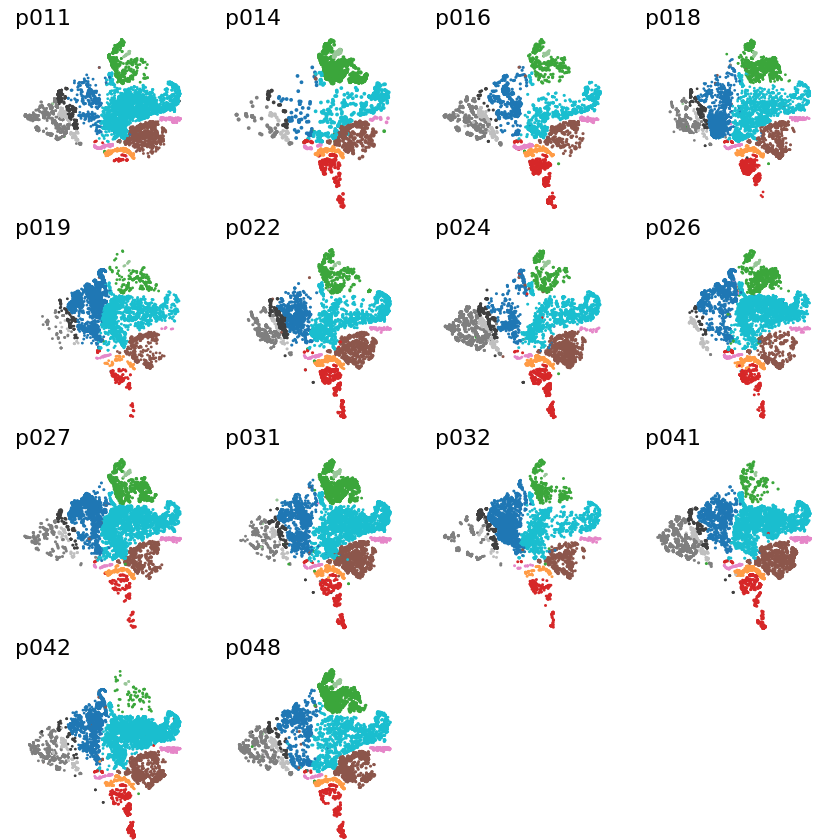

In [38]:
suppressMessages(library(gridExtra))
grid.arrange(grobs=plist, ncol=4)

In [39]:
ggsave(plot = arrangeGrob(grobs=plist, ncol=4), 
       file=file.path(FIGDIR, "20200525allCD_separatepatient_tsne_points.pdf"),
       height=10,
       width=10,
       useDingbats=FALSE)

# dotplot marker genes

In [42]:
levels(srobj$tier1name)

[1] "CD.Bclls"         "CD.Endth"         "CD.Epith"         "CD.Epith_Paneth" 
 [5] "CD.Fibroblast"    "CD.IGA_IGK_Plsma" "CD.IGA_IGL_Plsma" "CD.IGG_Plsma"    
 [9] "CD.IGM_Plsma"     "CD.Mloid"         "CD.Mstcl"         "CD.Tclls"

In [43]:
Idents(srobj) = factor(srobj$tier1name, levels=levels(srobj$tier1name)[c(3:4, 12, 1, 10, 8, 6, 7, 9, 11, 2, 5)])
markers = FindAllMarkers(srobj, assay="RNA",
               test.use="wilcox", 
               logfc.threshold = 0.25,
               min.pct = 0.1,
               only.pos = TRUE, 
               max.cells.per.ident = 5000)

Calculating cluster CD.Epith

Calculating cluster CD.Epith_Paneth

Calculating cluster CD.Tclls

Calculating cluster CD.Bclls

Calculating cluster CD.Mloid

Calculating cluster CD.IGG_Plsma

Calculating cluster CD.IGA_IGK_Plsma

Calculating cluster CD.IGA_IGL_Plsma

Calculating cluster CD.IGM_Plsma

Calculating cluster CD.Mstcl

Calculating cluster CD.Endth

Calculating cluster CD.Fibroblast



In [44]:
genes.use = markers %>% group_by(cluster) %>%  top_n(2, wt=avg_logFC)

In [45]:
srobj = ScaleData(srobj, features=genes.use$gene)

Centering and scaling data matrix



In [48]:
cells.use = srobj@meta.data %>% group_by(tier1name) %>% sample_n(100) %>% .$CellID %>% as.character

In [49]:
srobj

An object of class Seurat 
44884 features across 124054 samples within 2 assays 
Active assay: SCT (21865 features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, tsne

In [50]:
p = DotPlot(srobj,
            features=genes.use$gene,
#           size=2,
#           cells=cells.use, 
#           group.colors = celltype_colors[levels(Idents(srobj))],
#           raster=FALSE,
#           label=TRUE
)

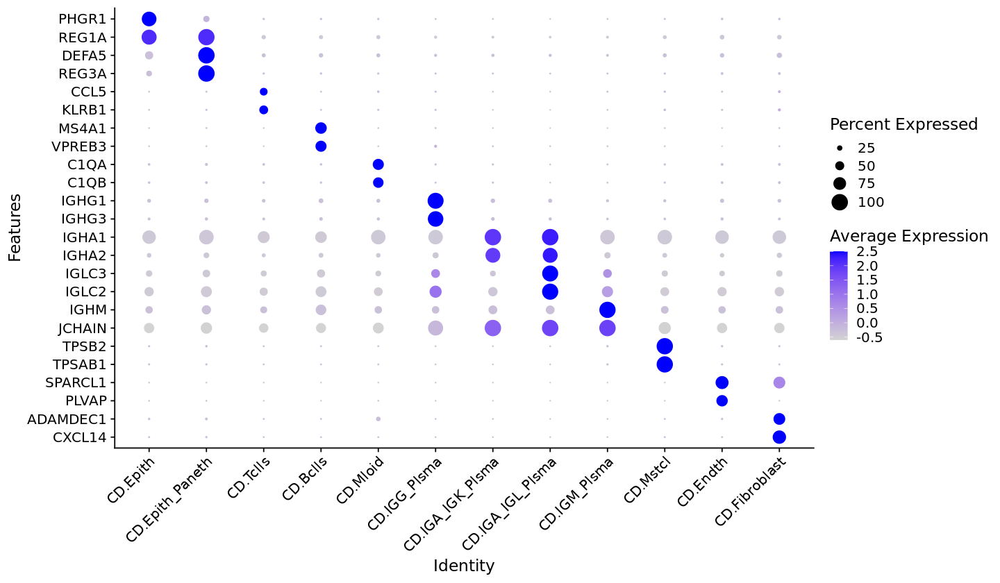

In [51]:
options(repr.plot.width = 12, repr.plot.height = 7)
p + theme(axis.text.x = element_text(angle=45, hjust=1)) + coord_flip()

In [53]:
FIGDIR=file.path(Sys.getenv("FIGDIR"), "cd14atlas", "dotplot")
dir.create(FIGDIR, recursive = TRUE, showWarnings = FALSE)

In [54]:
ggsave(plot=p + theme(axis.text.x = element_text(angle=45, hjust=1)) + coord_flip(),
       file=file.path(FIGDIR, "20200525alldata_markergenes_dotplot.pdf"),
       height=7, width=12,
       useDingbats=FALSE)

# Cell subset tsnes

In [68]:
levels(srobj$celltypes)

[1] "Bclls"          "Endth"          "Epith"          "Fibro"         
 [5] "Glial"          "IGA_IGK_Plsma"  "IGA_IGL_Plsma"  "IGG_Plsma_Bcll"
 [9] "IGM_Plsma"      "Mloid"          "Mstcl"          "Tclls"

In [56]:
nodoublet_dir = "~/CD14/srobjs_doubletsremoved"
dir.create(nodoublet_dir, recursive = TRUE, showWarnings = FALSE)

In [57]:
filename = Sys.glob("~/CD14/T1*")[1]

In [59]:
FIGDIR=file.path(Sys.getenv("FIGDIR"), "cd14atlas", "subset_tsnes")
dir.create(FIGDIR, recursive = TRUE, showWarnings = FALSE)

In [66]:
for (filename in Sys.glob("~/CD14/T1*")) {
    srobj.celltype = readRDS(filename)
    srobj.celltype@meta.data = CD14@meta.data[colnames(srobj.celltype), ]
    srobj.celltype = srobj.celltype[, !grepl("Doub|LowQual", srobj.celltype$type)]
    srobj.celltype <- RunTSNE(srobj.celltype, 
             initialization = srobj.celltype@reductions$pca@cell.embeddings[, 1:2],
             perplexity_list = c(30, ncol(srobj.celltype)/100),
             learning_rate = ncol(srobj.celltype)/12,
             exaggeration = 12,
             dims = srobj.celltype@misc$nPCs,
             tsne.method = "FIt-SNE",
             fast_tsne_path = file.path(Sys.getenv("FAST_TSNE_BIN"), "fast_tsne"))

    celltype = substr(as.character(srobj.celltype$tier1name[1]), 4, 100)
    saveRDS(srobj.celltype, file.path(nodoublet_dir, sprintf("%s_srobj.rds", celltype)))
}

Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”
Warning message:
“The following arguments are not used: pca”


[1] "Bclls"
[1] "Endth"


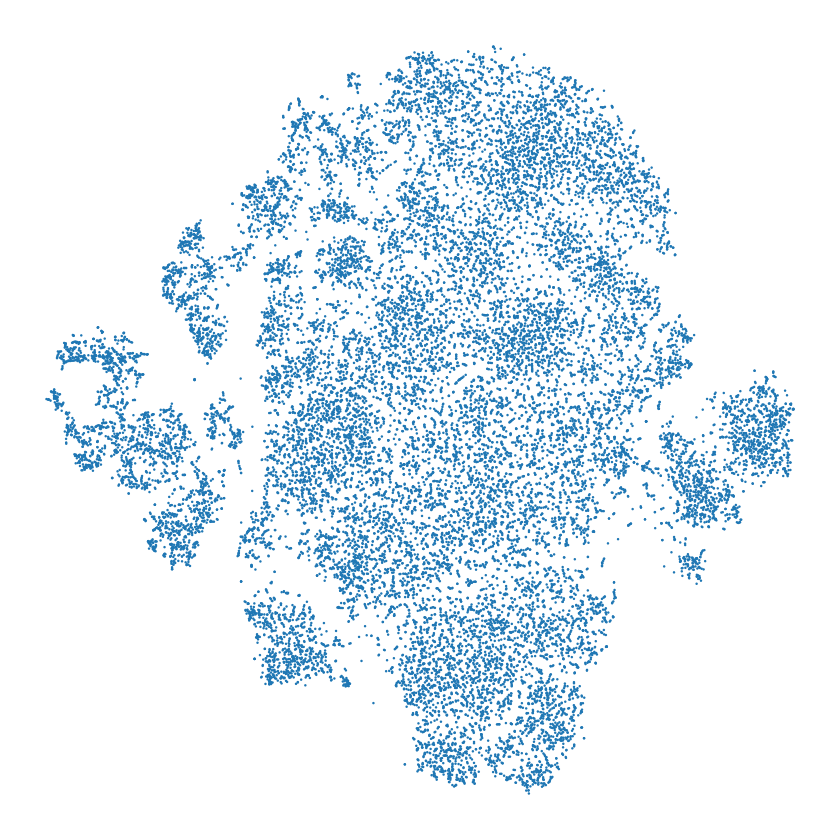

[1] "Epith_Paneth"


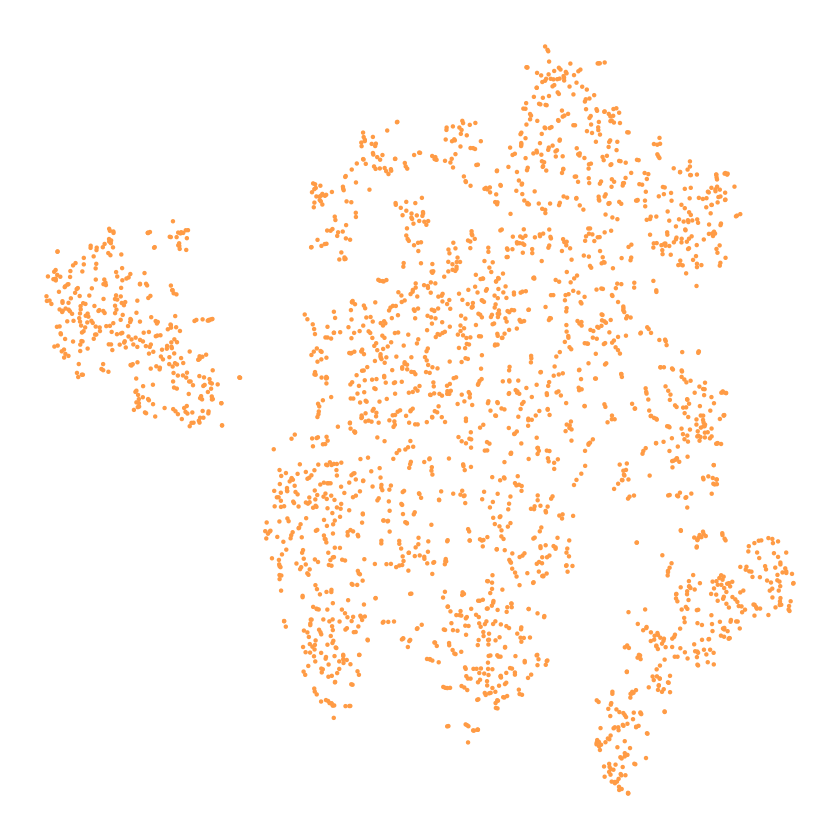

[1] "Epith"


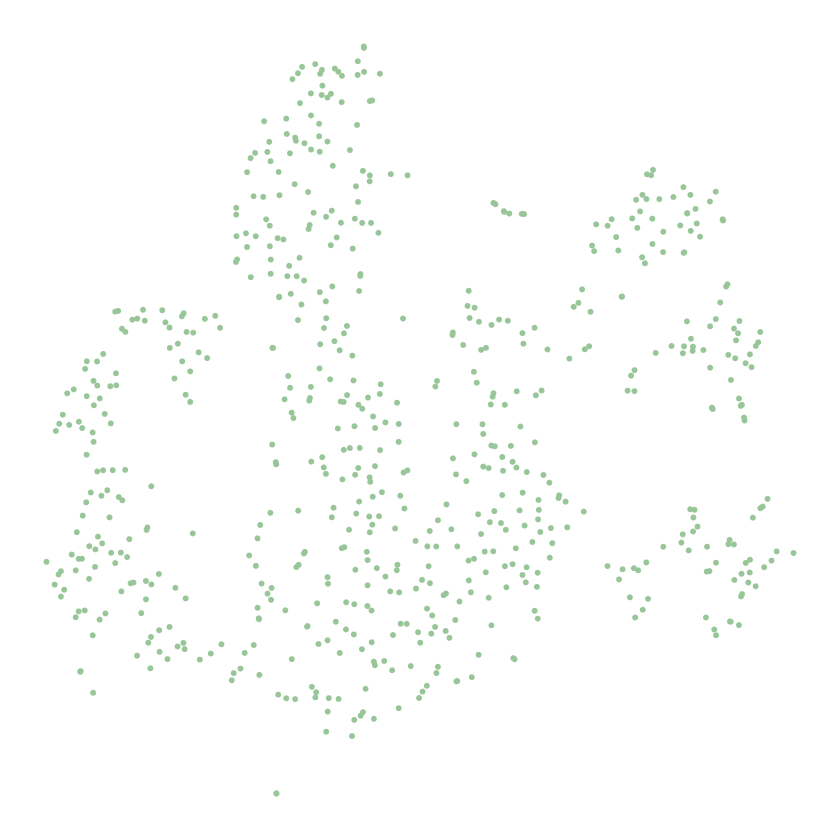

[1] "Fibroblast"


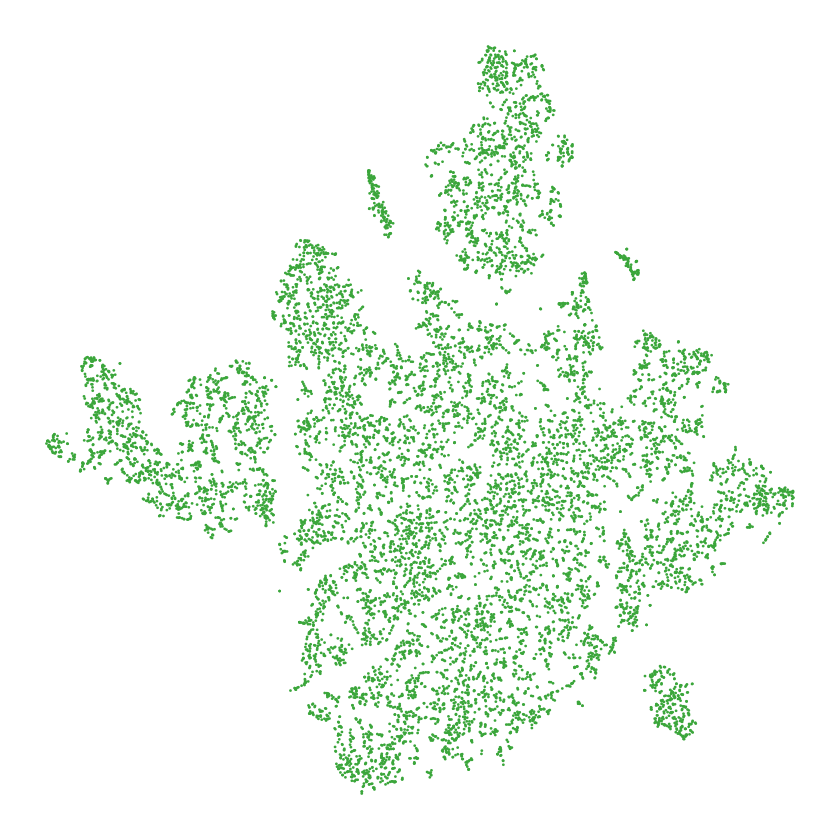

[1] "IGA_IGK_Plsma"


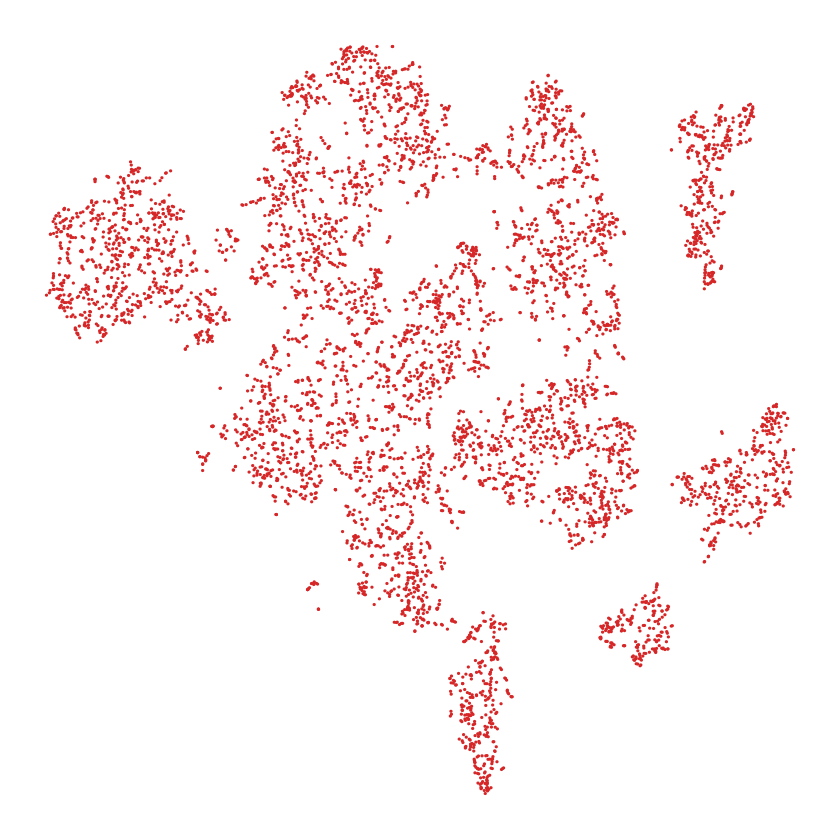

[1] "IGA_IGL_Plsma"


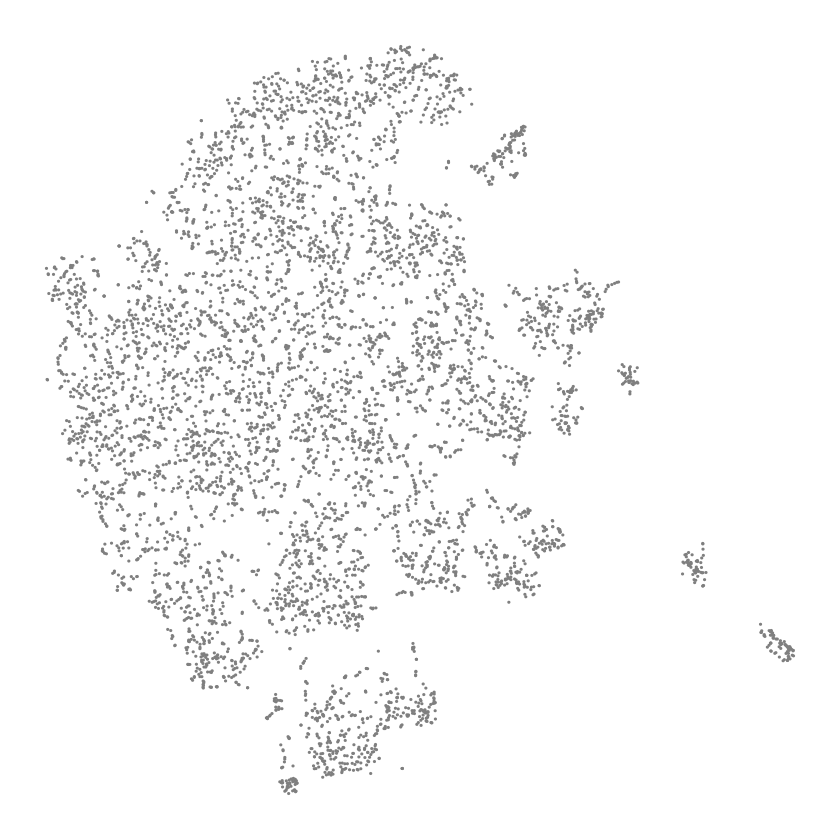

[1] "IGG_Plsma"


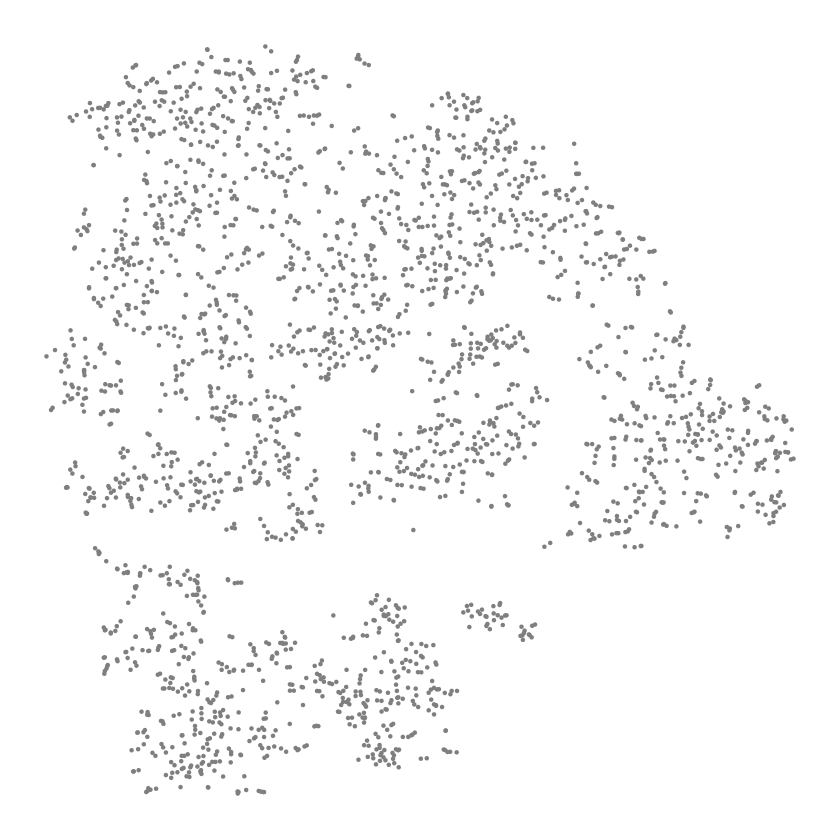

[1] "IGM_Plsma"


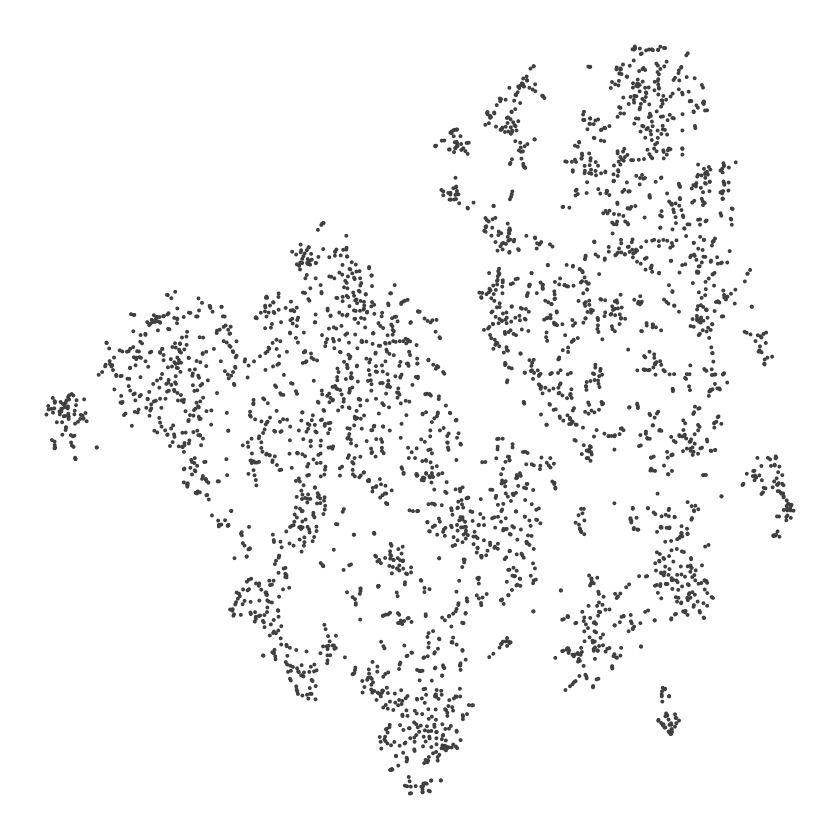

[1] "Mloid"


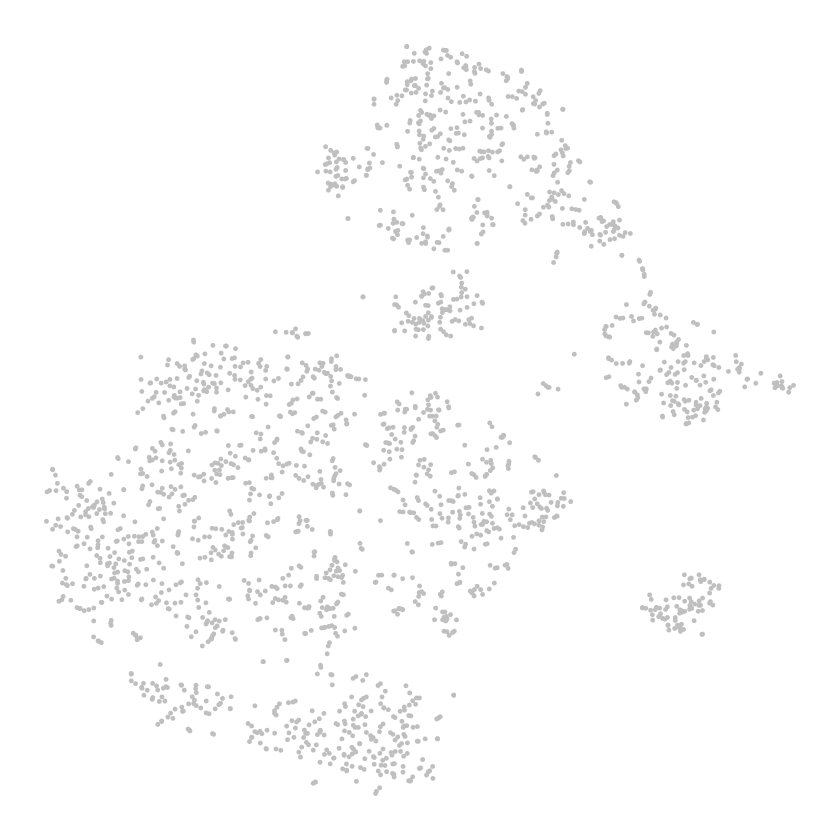

[1] "Mstcl"


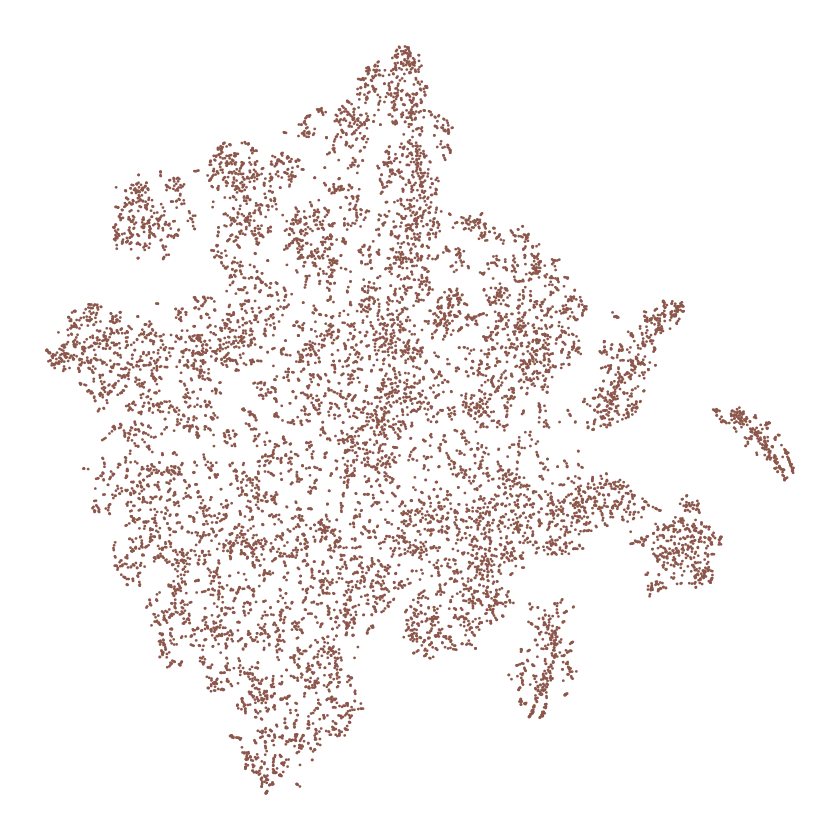

[1] "Tclls"


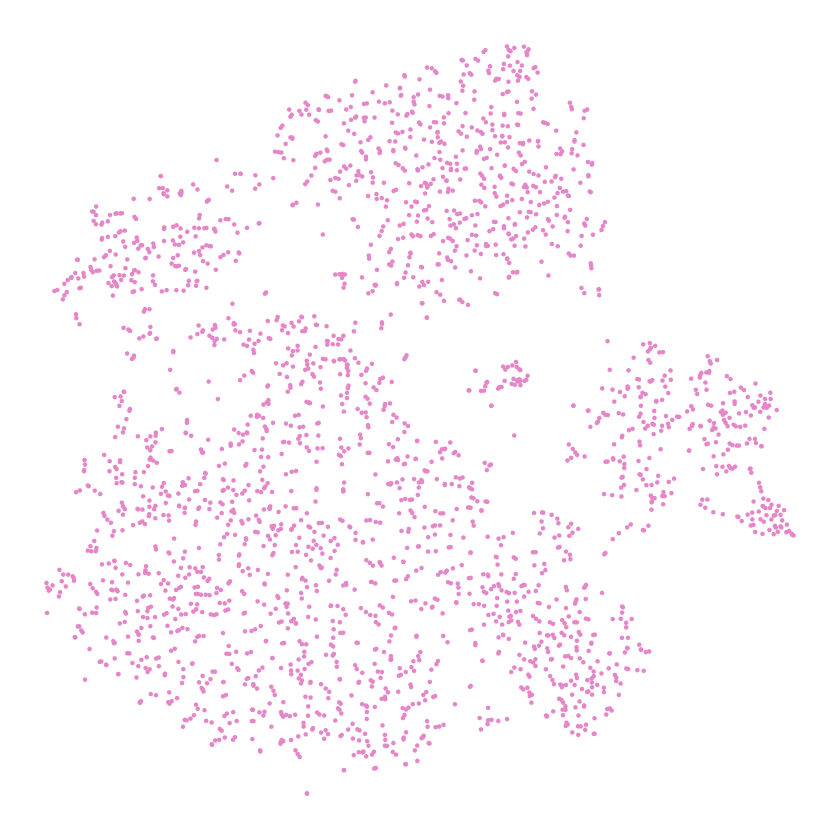

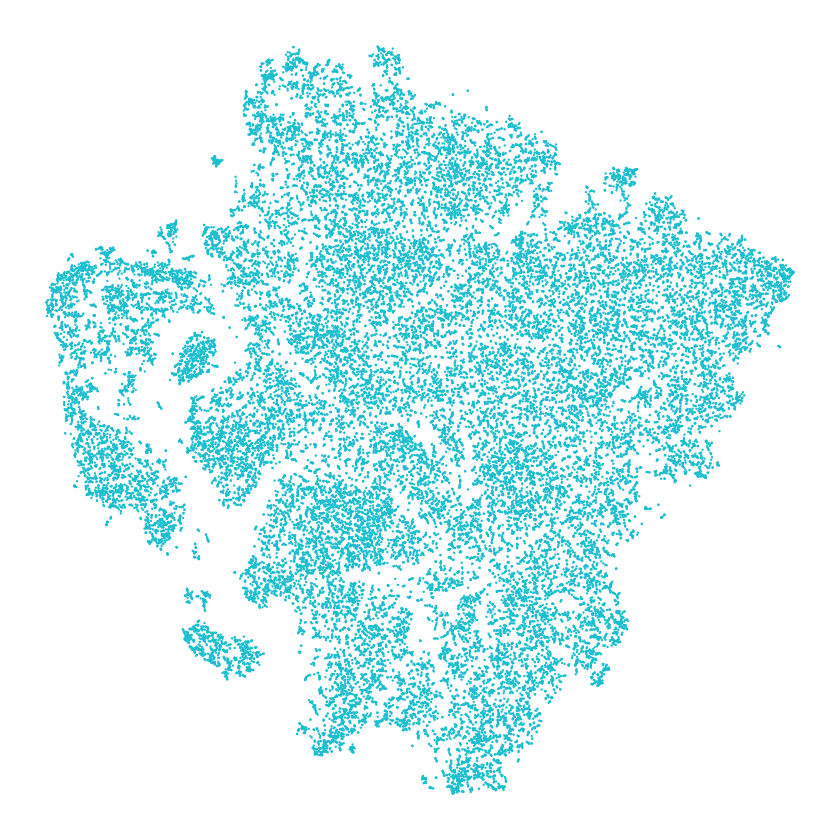

In [67]:
options(repr.plot.width = 7, repr.plot.height = 7)
for (filename in Sys.glob("~/CD14/srobjs_doubletsremoved/*")) {
    
    srobj.celltype = readRDS(filename)
    p = DimPlot(srobj.celltype, group.by="tier1name", cols=celltype_colors) +
        theme_void() +
        theme(legend.position="bottom")
    L = get_legend(p)
    
    celltype = gsub("_sr.*", "", basename(filename))
    
    print(celltype)
    print(p + NoLegend())
    
    
#     print(as_ggplot(L))
    
    ggsave(plot = p + NoLegend(), 
           file=file.path(FIGDIR, sprintf("%s_CD14_cellsubsets_tsne_points.pdf", celltype)),
           height=8, width=8,
           useDingbats=FALSE)
#     ggsave(plot = as_ggplot(L),
#            file=file.path(FIGDIR, sprintf("20200402_%s_FGID_cellsubsets_tsne_legend.pdf", celltype)),
#            useDingbats=FALSE)
}

# Cell Subset tsne (color TierNname)

[1] "Bclls"


Saving 6.67 x 6.67 in image



[1] "Endth"


Saving 6.67 x 6.67 in image



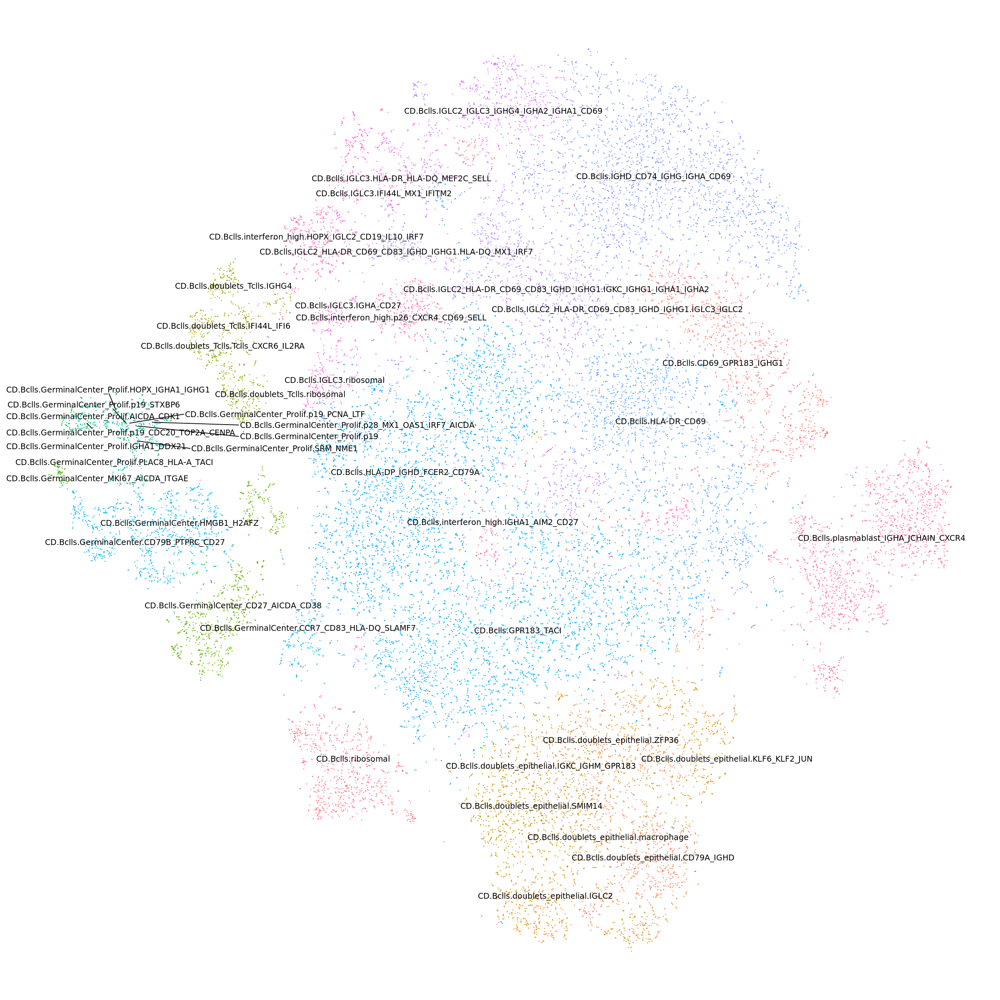

[1] "Epith_Paneth"


Saving 6.67 x 6.67 in image



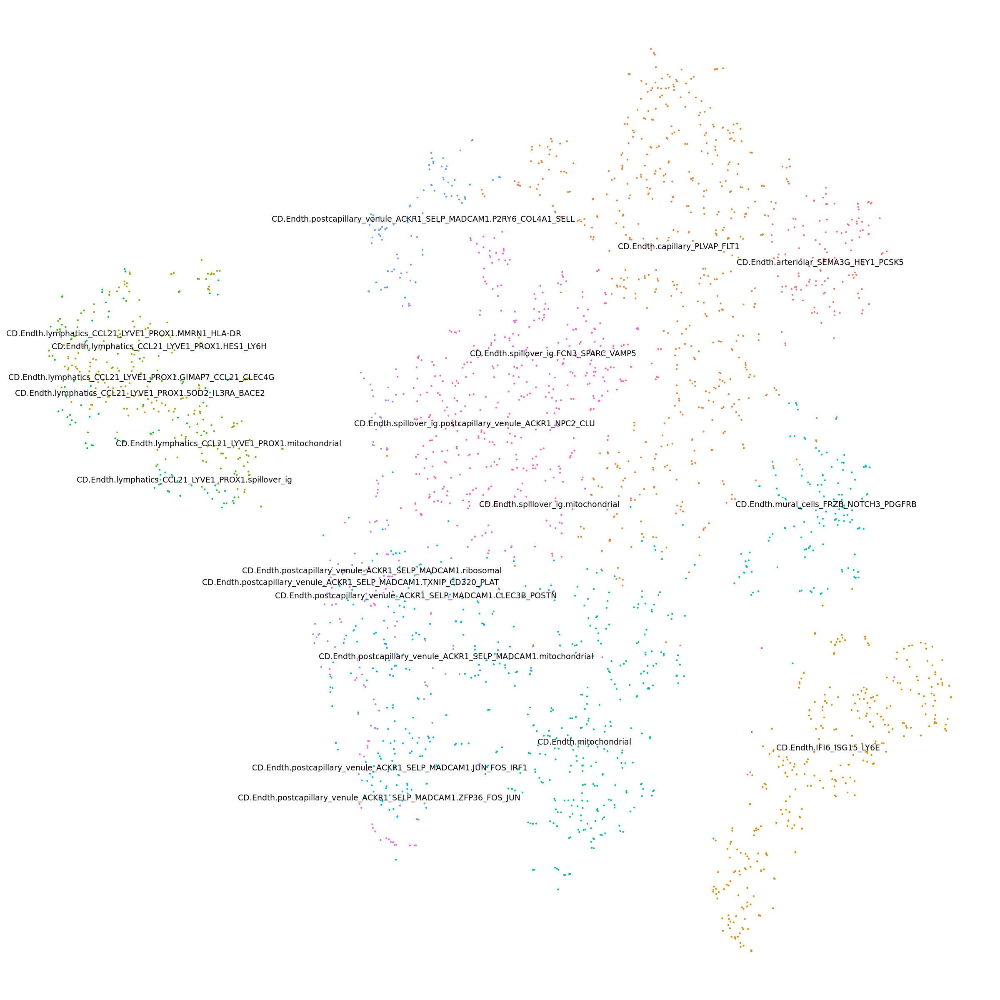

[1] "Epith"


Saving 6.67 x 6.67 in image



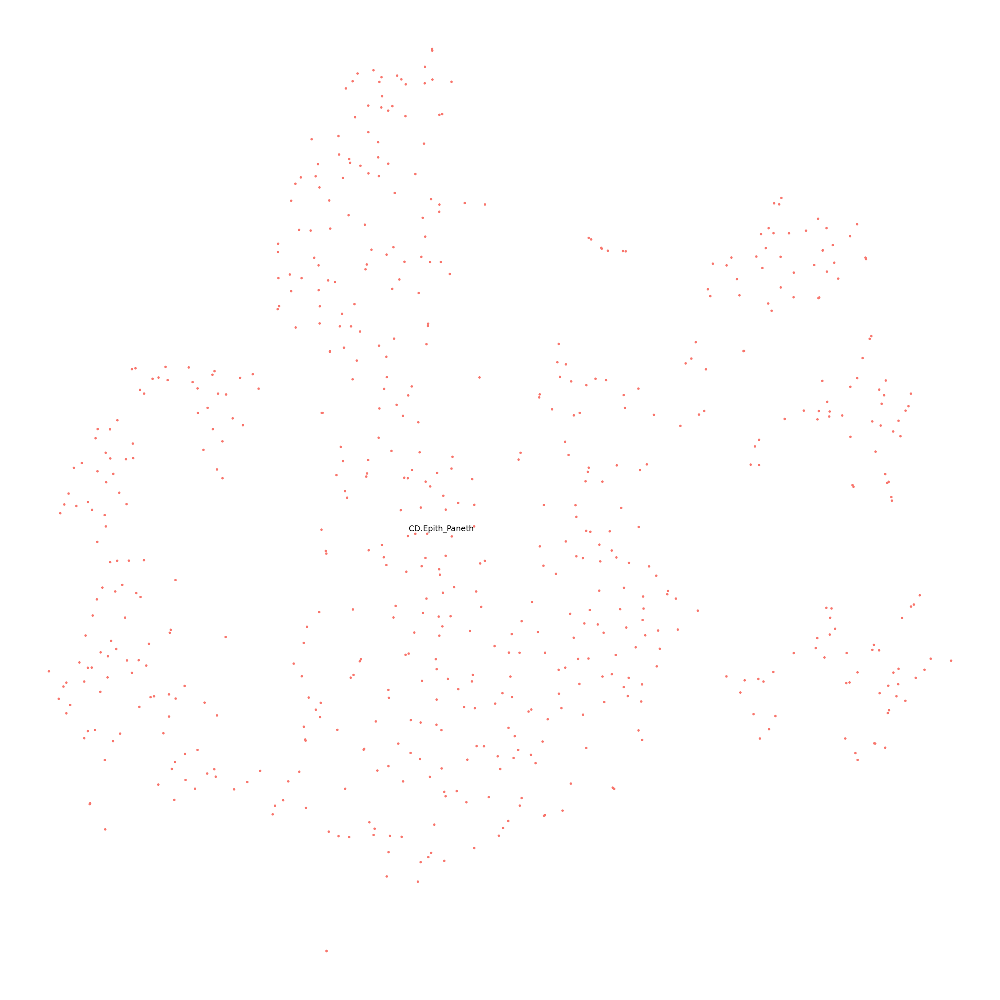

[1] "Fibroblast"


Saving 6.67 x 6.67 in image



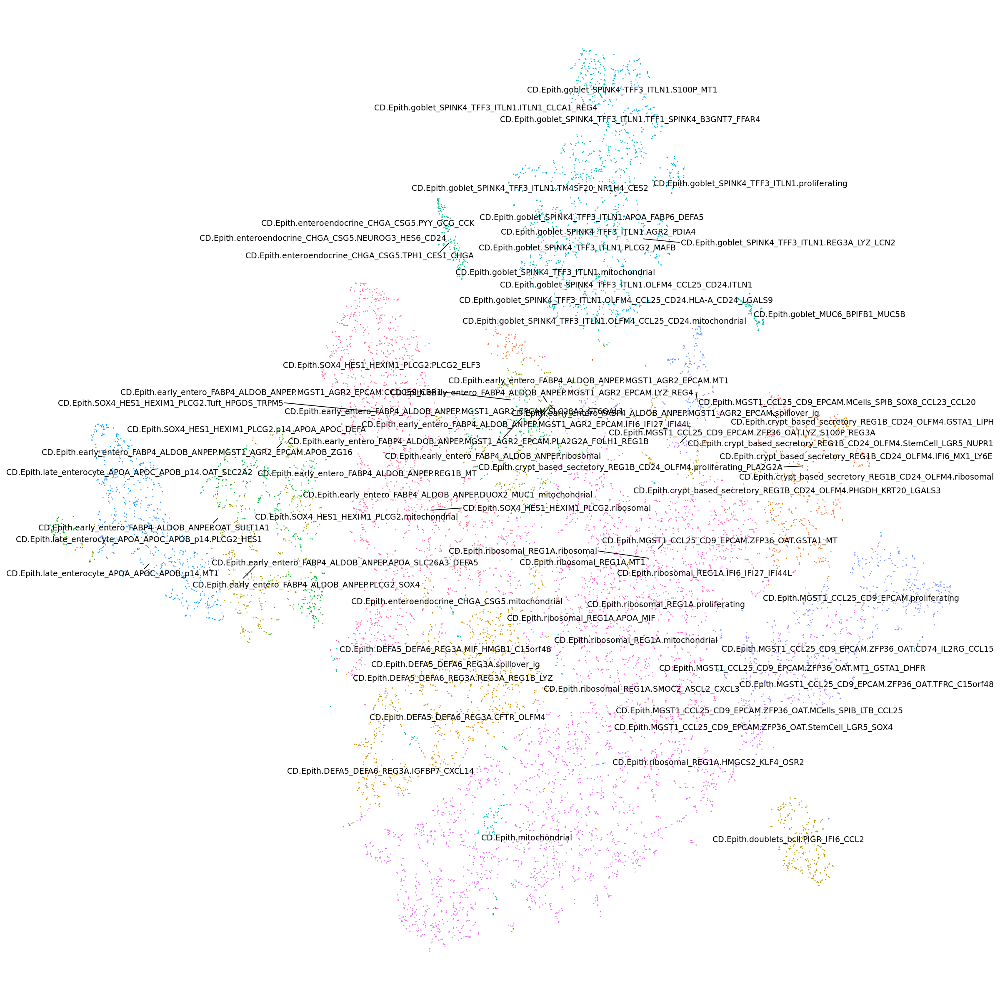

[1] "IGA_IGK_Plsma"


Saving 6.67 x 6.67 in image



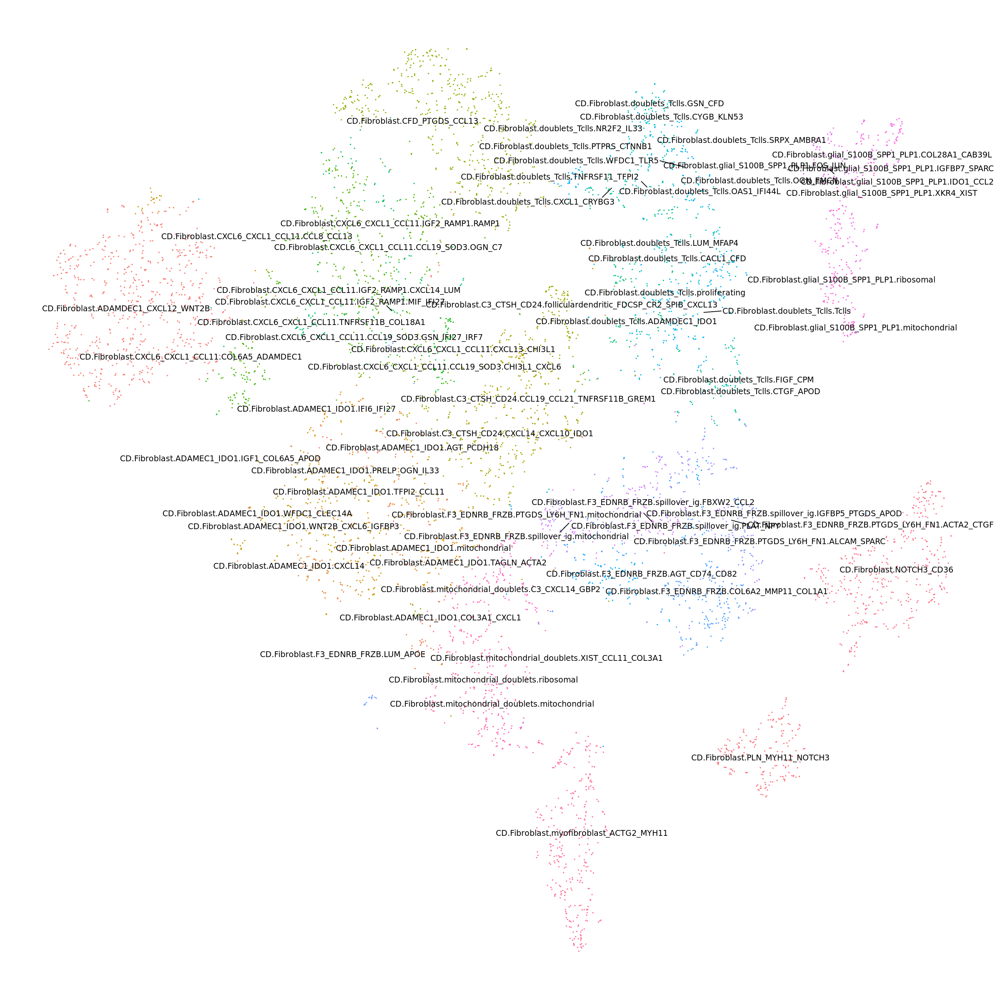

[1] "IGA_IGL_Plsma"


Saving 6.67 x 6.67 in image



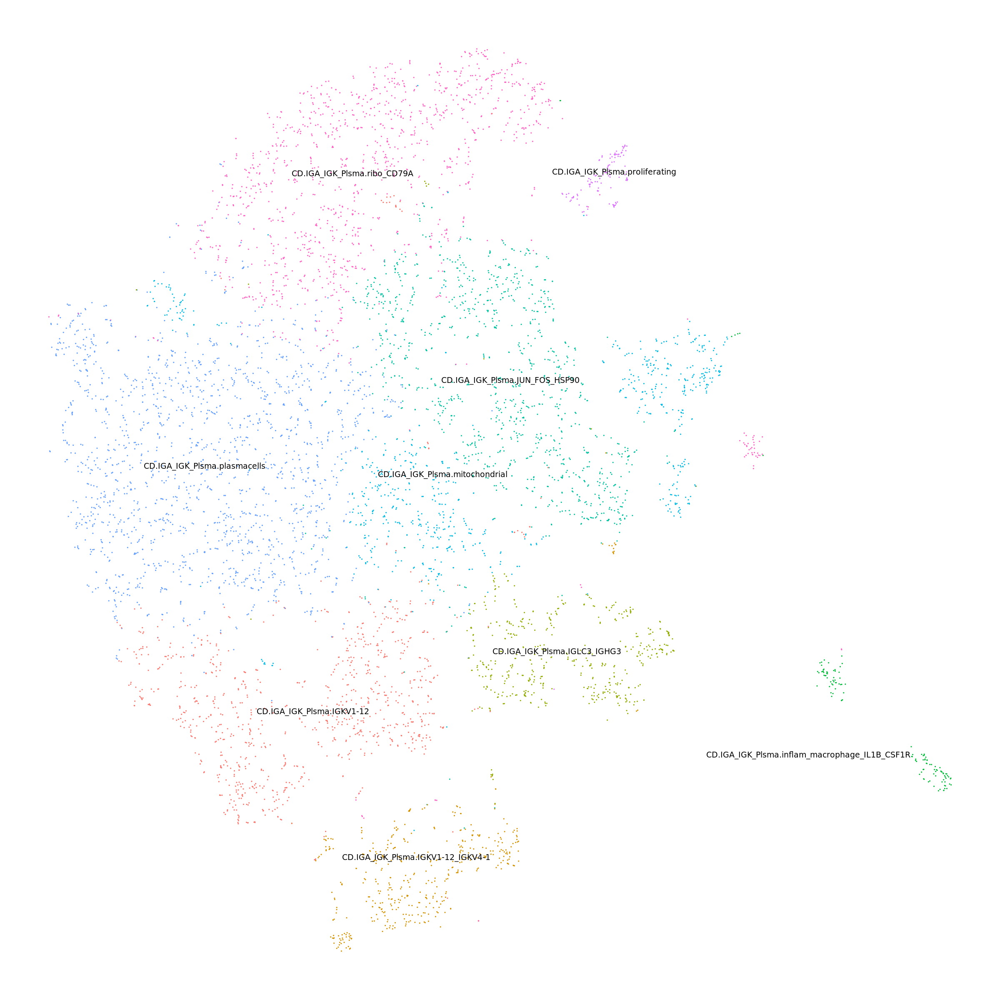

[1] "IGG_Plsma"


Saving 6.67 x 6.67 in image



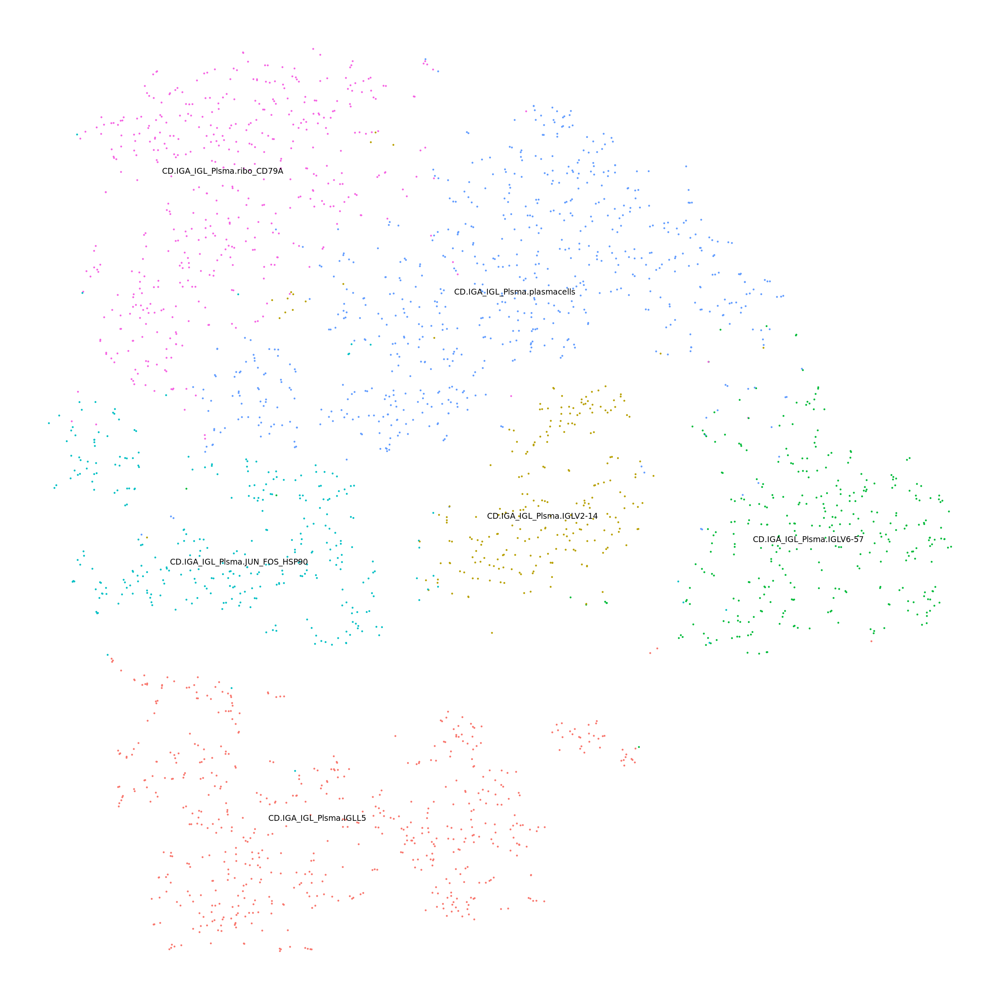

[1] "IGM_Plsma"


Saving 6.67 x 6.67 in image



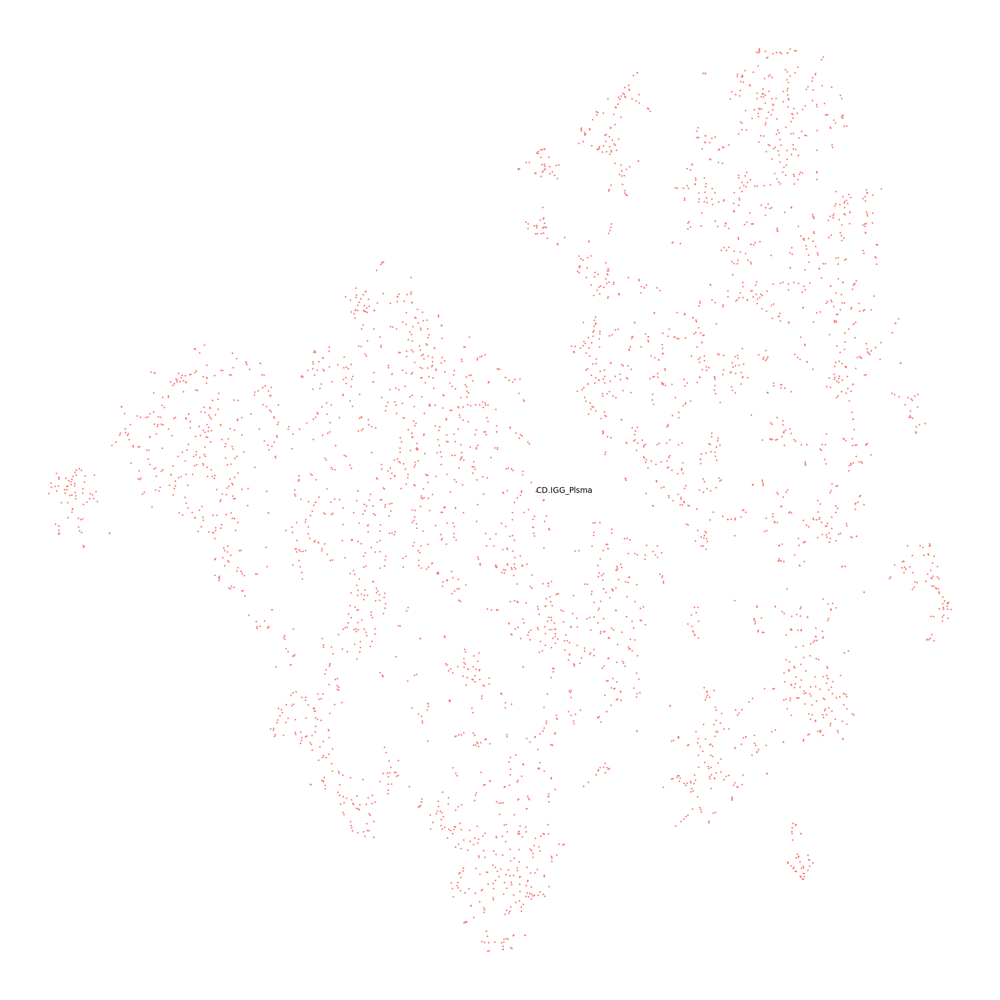

[1] "Mloid"


Saving 6.67 x 6.67 in image



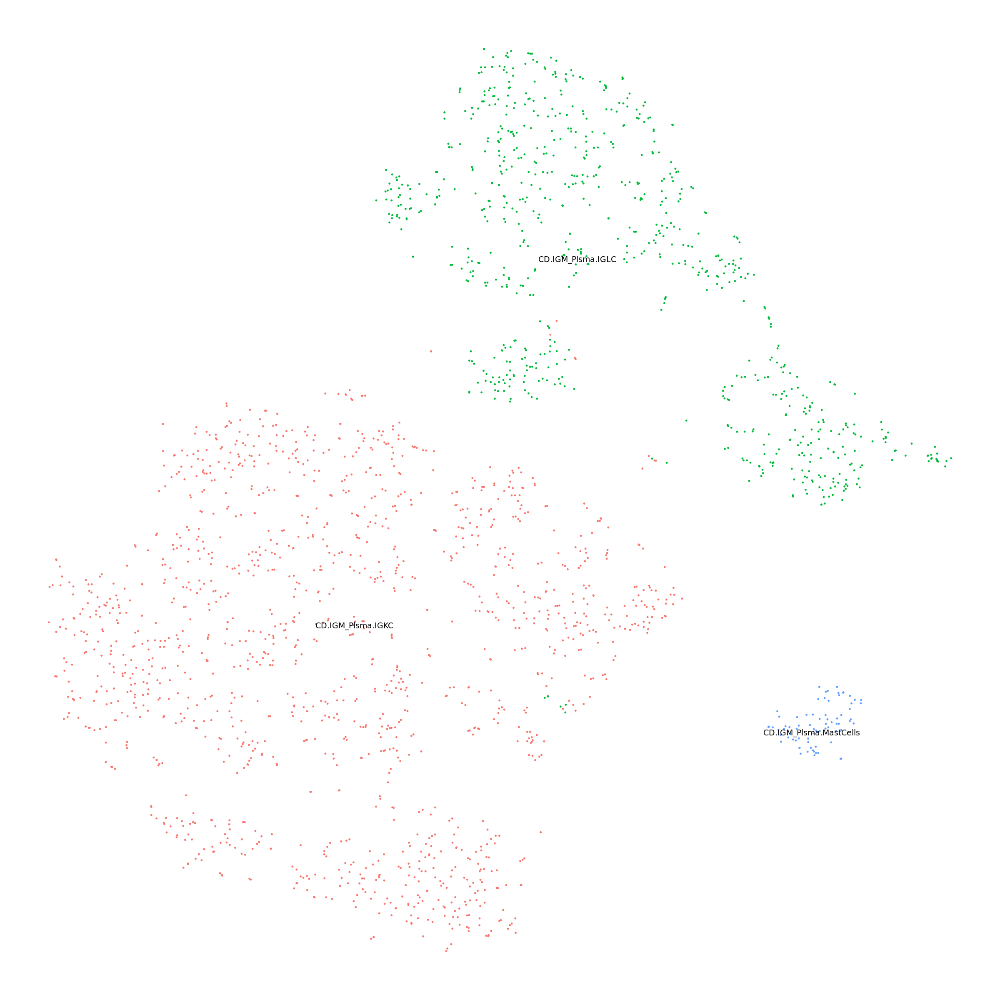

[1] "Mstcl"


Saving 6.67 x 6.67 in image



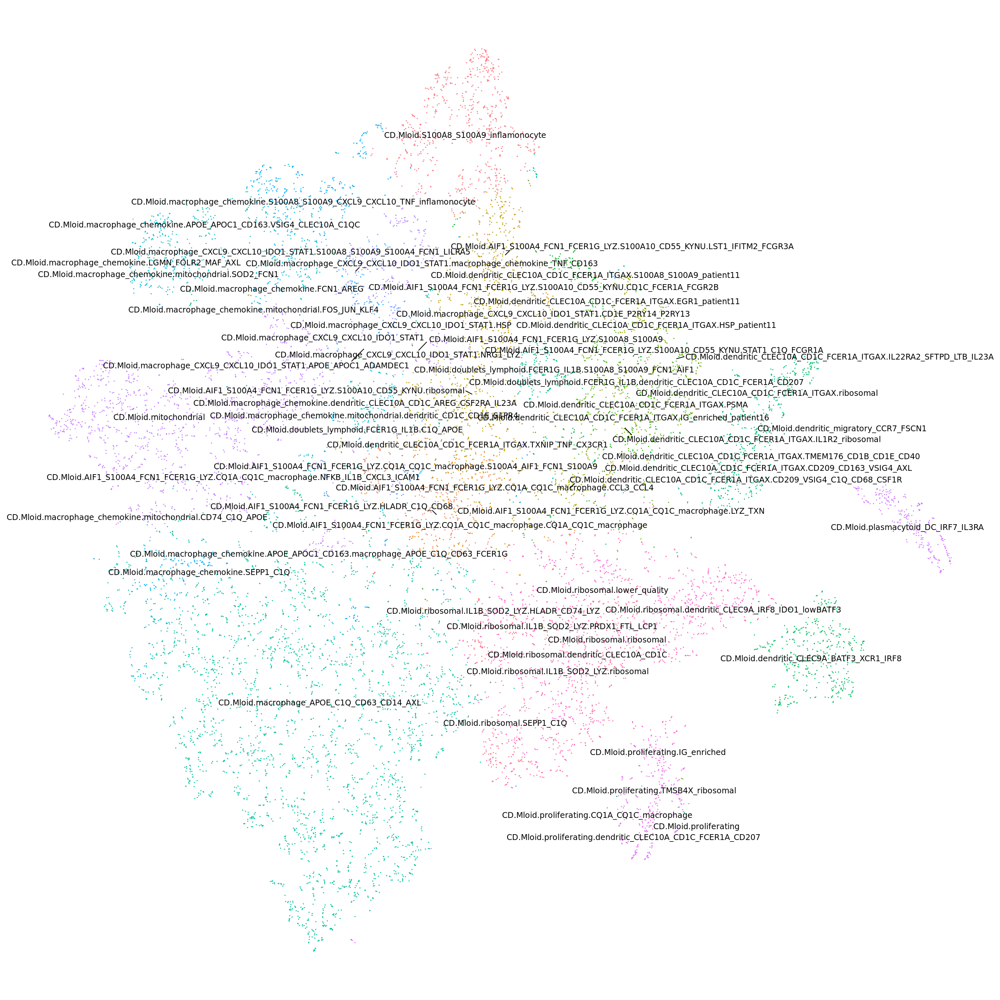

[1] "Tclls"


Saving 6.67 x 6.67 in image



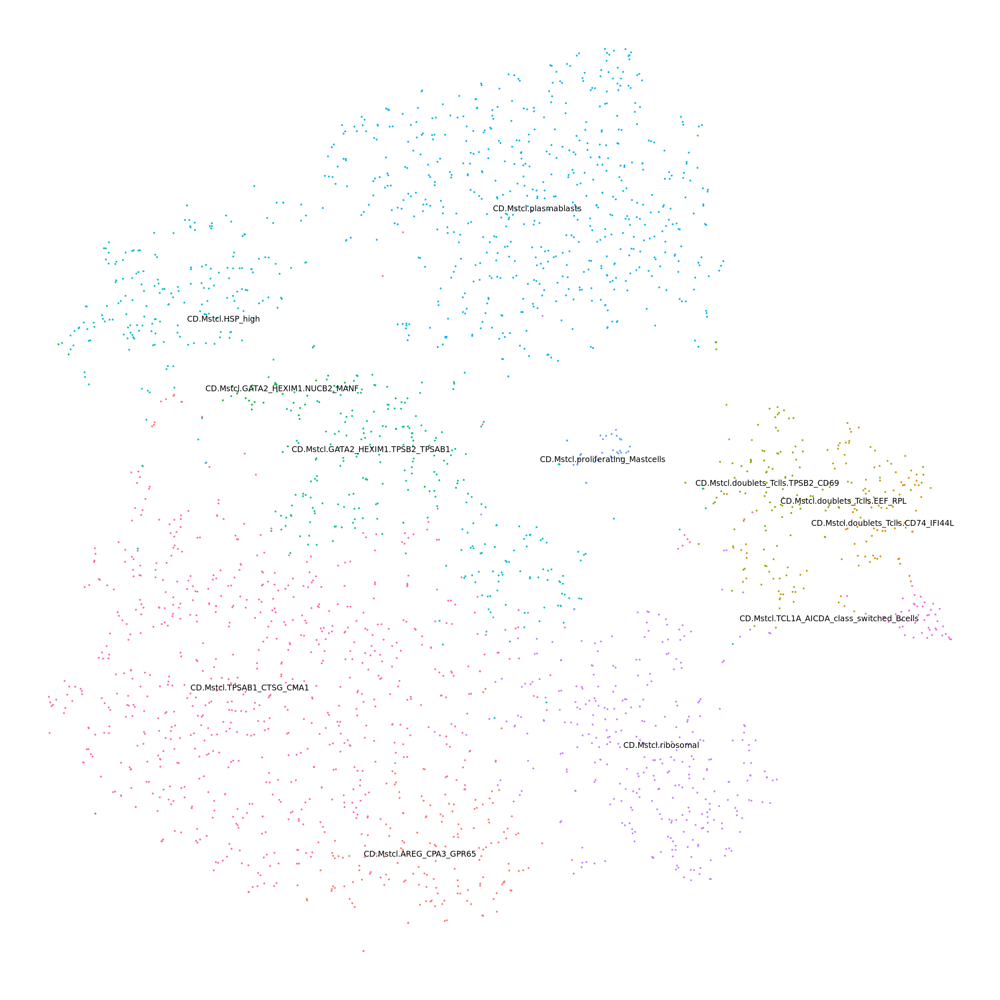

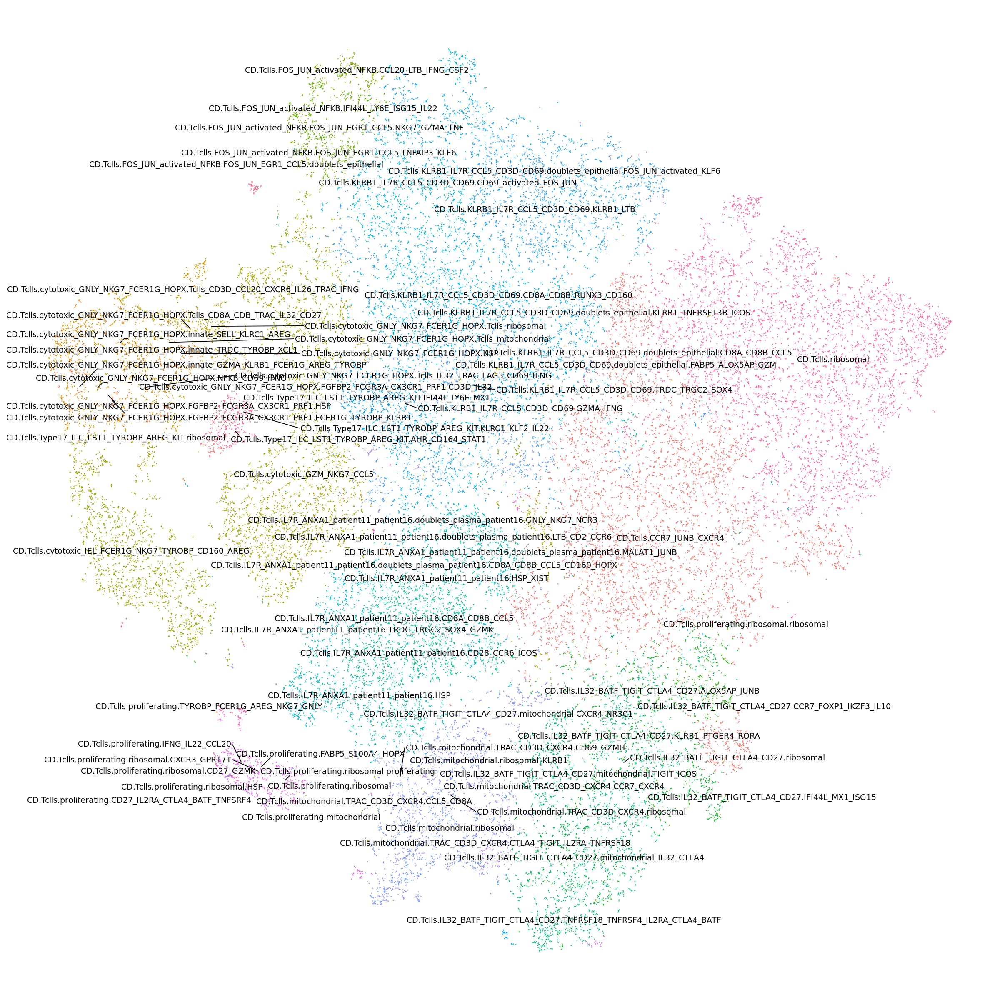

In [7]:
options(repr.plot.width = 20, repr.plot.height = 20)
cd14_meta = read.table("~/CD14/20200511_clmeta_CD14_all.tsv", header=1) %>% column_to_rownames("CellID")
for (filename in Sys.glob("~/CD14/srobjs_doubletsremoved/*")) {
    
    srobj.ctp = readRDS(filename)
    srobj.ctp@meta.data = cd14_meta[colnames(srobj.ctp), ]
    p = DimPlot(srobj.ctp, group.by="tierNname",
                label=TRUE, repel=TRUE, label.size=4) +
        theme_void() +
        theme(legend.position="bottom")
    L = get_legend(p)
    
    ctp = gsub("_sr.*", "", basename(filename))
    
    print(ctp)
    print(p + NoLegend())
    
    
#     print(as_ggplot(L))
    
    ggsave(plot = p + NoLegend(), 
           file=file.path(FIGDIR, sprintf("20200619_%s_CD14_tsne_tierNname.pdf", ctp)),
           height=10, width=10,
           useDingbats=FALSE)
    ggsave(plot = as_ggplot(L),
           file=file.path(FIGDIR, sprintf("20200619_%s_CD14_tsne_tierNname_legend.pdf", ctp)),
           useDingbats=FALSE)
}

# Sync

In [8]:
system(sprinf("gsutil -m rsync -r %s %s", Sys.getenv("FIGDIR"), Sys.getenv("FIG_BUCKET")))